# Phase 1 - Ingestion and Cleaning

In the Phase 2 of the Case Study, we will carry out the following steps:
  - Ingest raw downloaded data
  - Output a combined dataset ready for analysis and modeling

In [1]:
import pandas as pd
import os
from sys import platform
import matplotlib.pyplot as plt
import datetime
import numpy as np
import pickle
import seaborn

In [2]:
# A helper function that you'll be using while reading the raw files
def is_integer(x):
    '''
    This function returns True if x is an integer, and False otherwise
    '''
    try:
        return (int(x) == float(x))
    except:
        return False

## Parameters

In [3]:
# Define the directories that contain the files downloaded
dir_cs = r"C:\Users\MIQ\Desktop\CMU Docs\Spring 22\95828 - MLPS\Case Study\Phase 1\case_study_data\2003_download" # path to the directory where all the *.csv.zip files are located

# Define the output path for the pickle
pickle_file = 'C:\\Users\\varun\\Downloads\\MLPS\\Case Study\\' + "clean_data.pickle" # path to save cleaned data

In [4]:
# Identify the columns we'll be keeping from the dataset
cols_to_pick = ['id', 'loan_amnt',
'funded_amnt', 'term', 'int_rate', 'grade', 'emp_length', 'home_ownership',
'annual_inc', 'verification_status', 'issue_d', 'loan_status', 'purpose', 'dti',
'delinq_2yrs', 'earliest_cr_line', 'open_acc', 'pub_rec', 'fico_range_high',
'fico_range_low', 'revol_bal', 'revol_util', 'total_pymnt', 'recoveries','last_pymnt_d'] # list of features to use for this study as indicated in the handout

# Identify the type of each of these column based on your CS-Phase 1 response
float_cols = ['loan_amnt','funded_amnt','annual_inc','dti', 'revol_bal', 'delinq_2yrs', 
              'open_acc', 'pub_rec','fico_range_high', 'fico_range_low', 'total_pymnt', 'recoveries']
cat_cols = ['term','grade','emp_length','home_ownership','verification_status','loan_status','purpose'] # categorical features
perc_cols = ['int_rate', 'revol_util']
date_cols = ['issue_d', 'earliest_cr_line', 'last_pymnt_d']

# Ensure that we have types for every column
assert set(cols_to_pick) - set(float_cols) - set(cat_cols) - set(perc_cols) - set(date_cols) == set(["id"])

In [6]:
# Some of the columns selected will not be used directly in the model,
# but will be used to generate other features.
#
# Create variables specifying the features that will be used

# All categorical columns other than "loan_status" will be used as
# discrete features

discrete_features = list(set(cat_cols) - set(["loan_status"]))

# All numeric columns will be used as continuous features
continuous_features = list(float_cols + perc_cols)

## Ingestion
Ingest the data files from both sets, perform consistency checks, and prepare one single file for each set

In [7]:
def ingest_files(directory):
    '''
    This function will ingest every file in the specified directory
    into a pandas dataframe. It will return a dictionary containing
    these dataframes, keyed by the file name.
    
    We assume the directory contains files directly downloaded from
    the link given in the handout, and *only* those files. Thus, we 
    assume the files are zipped (pd.read_csv can read zipped files) 
    and we assume the first line in each file needs to be skipped.
    
    Note that each file will be read *without* formatting
    '''
    
    # If the directory has no trailing slash, add one
    if directory[-1] != "/":
        directory += "/"
    
    all_files = os.listdir(directory) # get list of all files from the directory
    output = {}
    
    print("Directory " + directory + " has " + str(len(all_files)) + " files:")
    for i in range(len(all_files)):
        print("    Reading file " + all_files[i])
        output[i] = pd.read_csv(directory + "\\" +all_files[i],dtype = str,skiprows=1) # read each with dtype='str' and skip_rows =1
        
        # Some of the files have "summary" lines that, for example
        # read "Total number of loans number in Policy 1: ....."
        # To remove those lines, find any lines with non-integer IDs
        # and remove them
        invalid_rows = np.array([False if is_integer(x) else True for x in output[i]['id']]) # mask rows that have non-integer IDs. Use is_integer method
        if invalid_rows.sum() > 0:
            print("Found " + str(invalid_rows.sum()) + " invalid rows which were removed")
            output[i] = output[i][~invalid_rows] # remove invalid rows
    
    return output # return dictionary of dataframe

In [8]:
# Ingest the set of files we downloaded using the defined method "ingest_files"
files_cs = ingest_files(dir_cs) # dictioary of (filename, dataframe) as (key, value)

Directory C:\Users\MIQ\Desktop\CMU Docs\Spring 22\95828 - MLPS\Case Study\Phase 1\case_study_data\2003_download/ has 20 files:
    Reading file LoanStats3a_securev1.csv.zip
Found 3 invalid rows which were removed
    Reading file LoanStats3b_securev1.csv.zip
Found 2 invalid rows which were removed
    Reading file LoanStats3c_securev1.csv.zip
Found 2 invalid rows which were removed
    Reading file LoanStats3d_securev1.csv.zip
Found 2 invalid rows which were removed
    Reading file LoanStats_securev1_2016Q1.csv.zip
Found 2 invalid rows which were removed
    Reading file LoanStats_securev1_2016Q2.csv.zip
Found 2 invalid rows which were removed
    Reading file LoanStats_securev1_2016Q3.csv.zip
Found 2 invalid rows which were removed
    Reading file LoanStats_securev1_2016Q4.csv.zip
Found 2 invalid rows which were removed
    Reading file LoanStats_securev1_2017Q1.csv.zip
Found 2 invalid rows which were removed
    Reading file LoanStats_securev1_2017Q2.csv.zip
Found 2 invalid rows wh

### Combine the files

In [ ]:
data_cs = pd.DataFrame(columns = list(files_cs[1].columns))  # combine "files_cs" into a pandas dataframe
for i in files_cs.keys():
    data_cs = pd.concat([data_cs,files_cs[i]])
    
data_cs.reset_index(drop = True) # resent index with drop = True

## Prepare Final Dataset

In [ ]:
# Keep only the columns of interest from 'data_cs'
final_data = data_cs[cols_to_pick]

In [ ]:
final_data = final_data.reset_index()

In [ ]:
print("Starting with " + str(len(final_data)) + " rows")

### Typecast the columns

In [ ]:
final_data.columns

In [13]:
# Remember that we read the data as string (without any formatting). 
# Now we would typecast the columns based on feature types which you found out in CS Phase 1

for i in float_cols:
    final_data[i] = final_data[i].astype(float) # typecast float columns

In [14]:
def clean_perc(x):
    if pd.isnull(x):
        return np.nan
    else:
        return float(x.strip()[:-1])

for i in perc_cols:
    final_data[i] = final_data[i].apply(clean_perc) # apply clean_perc to percentage columns

In [15]:
def clean_date(x):
    if pd.isnull(x):
        return None
    else:
        return datetime.datetime.strptime( x, "%b-%Y").date()

for i in date_cols:
    final_data[i] = final_data[i].apply(clean_date) # typecast date cloumns to datatime using clean_date

In [16]:
for i in cat_cols:
    row_index = final_data[i].isnull()
    final_data.loc[row_index,i] = None # for categorical features if the value is null/empty set it to None

## Calculate returns for each loan

In [17]:
# Define the names of the four returns we'll be calculating as described in Q.6
# ret_PESS: Pessimistic return
# ret_OPT: Optimistic return
# ret_INTa, ret_INTb: Method3 at two differnt values of "i"
ret_cols = ["ret_PESS", "ret_OPT", "ret_INTa", "ret_INTb"]

In [18]:
# Remove all rows for loans that were paid back on the days they were issued
final_data['loan_length'] = (final_data.last_pymnt_d - final_data.issue_d) / np.timedelta64(1, 'M')
n_rows = len(final_data)

final_data = final_data.loc[final_data['loan_length'] != 0]  # select rows where loan_length is not 0. 

print("Removed " + str(n_rows - len(final_data)) + " rows")

Removed 12361 rows


### M1-Pessimistic Method

In [19]:
# Calculate the return using a simple annualized profit margin
# Pessimistic definition (Handout 6a.) (M1)

final_data['term_num'] = final_data.term.str.extract('(\d+)',expand=False).astype(int) # length of loan in months

final_data['ret_PESS'] = ((final_data['total_pymnt'] - final_data['funded_amnt']) / final_data['funded_amnt']) * 12 / final_data['term_num']

### M2-Optimistic Method

In [20]:
# Assuming that if a loan gives a positive return, we can
# immediately find a similar loan to invest in; if the loan
# takes a loss, we use M1-pessimistic to compute the return

final_data['ret_OPT'] = ((final_data['total_pymnt'] - final_data['funded_amnt']) / final_data['funded_amnt']) * 12 / final_data['loan_length']

final_data.loc[final_data.ret_OPT < 0,'ret_OPT'] = final_data.loc[final_data.ret_OPT < 0,'ret_PESS']

### Method 3

In [21]:
def ret_method_3(T, i):
    '''
    Given an investment time horizon (in months) and re-investment
    interest rate, calculate the return of each loan
    '''
    
    # Assuming that the total amount paid back was paid at equal
    # intervals during the duration of the loan, calculate the
    # size of each of these installment
    actual_installment = (final_data.total_pymnt - final_data.recoveries) / final_data['loan_length']

    # Assuming the amount is immediately re-invested at the prime
    # rate, find the total amount of money we'll have by the end
    # of the loan
    cash_by_end_of_loan = actual_installment * ((1 - ((1+i)**final_data['loan_length'])) / (1-(1+i))) # compute the quantity given in [] in eq.2.3 of handout
    
    cash_by_end_of_loan = cash_by_end_of_loan + final_data.recoveries
    
    # Assuming that cash is then re-invested at the prime rate,
    # with monthly re-investment, until T months from the start
    # of the loan
    remaining_months = T - final_data['loan_length']
    final_return = (cash_by_end_of_loan * ((1+i)**remaining_months)) - final_data['funded_amnt']

    # Find the percentage return
    ret_val = (12/T) * final_return * (1/final_data['funded_amnt'])
    return ret_val

In [22]:
final_data['ret_INTa'] = ret_method_3(60,0.023) # call ret_method_3 with T=60, i=0.023
final_data['ret_INTb'] = ret_method_3(60,0.04) # call ret_method_3 with T=60, i=0.04

### Visualize the variables

In [23]:
def visualize_float_columns():
    '''
    This function visualizes Box-and-whisker plots for continuous variables
    '''
    
    # FLoat columns
    for i in float_cols + perc_cols + ret_cols:
        seaborn.boxplot(final_data[i])

        # Print the three highest values
        highest_vals = final_data[i].nlargest(3,keep = 'last').reset_index(drop = True) # get 3 highest values
        
        smallest_val = min(final_data[i])
        
        plt.text(smallest_val, -0.3, highest_vals[0])
        plt.text(smallest_val, -0.2, highest_vals[1])
        plt.text(smallest_val, -0.1, highest_vals[2])

        plt.show()

In [24]:
def visualize_cat_columns():
    '''
    Lists the distinct values for categorical columns
    '''
    # Categorical columns 
    for i in cat_cols:
        print(i) # print field name
        print(final_data[i].unique()) # print number of distinct values
        print(final_data[i].value_counts()) # for each distinct value print the number of occurances
        print("")
        print("")

In [25]:
def visualize_date_columns():
    '''
    This function visualizes a timeline density for dates
    '''
    
    # Date columns
    for i in date_cols:
        final_data[final_data[i].isnull() == False][i].apply(lambda x : str(x.year) +
                                                "-" + str(x.month)).value_counts(ascending = True).plot()
        plt.title(i + " (" + str(final_data[i].isnull().sum()) + " null values)")
        plt.show()

C:\Users\varun\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


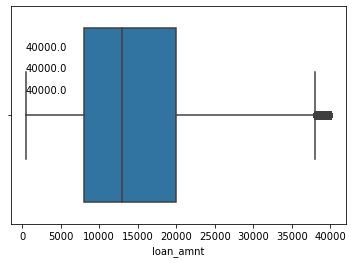

C:\Users\varun\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


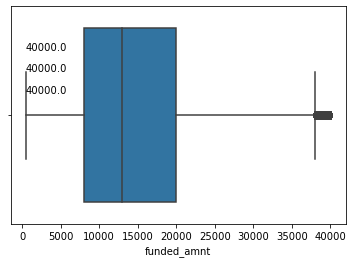

C:\Users\varun\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


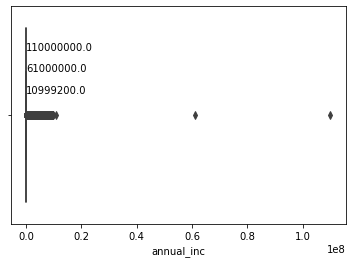

C:\Users\varun\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


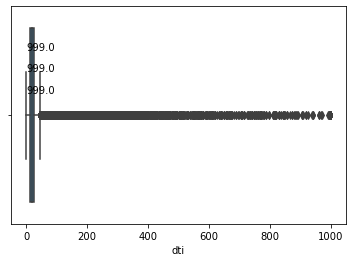

C:\Users\varun\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


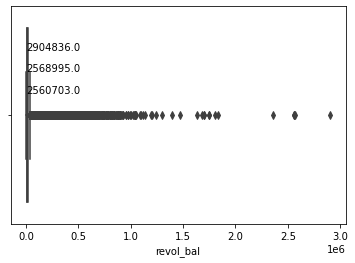

C:\Users\varun\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


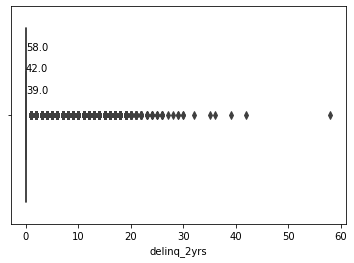

C:\Users\varun\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


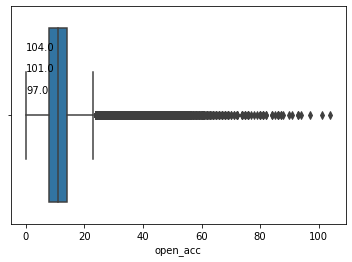

C:\Users\varun\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


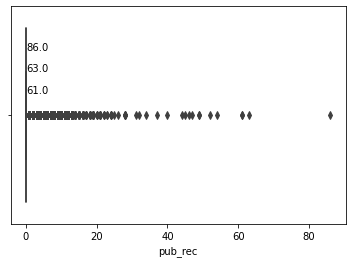

C:\Users\varun\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


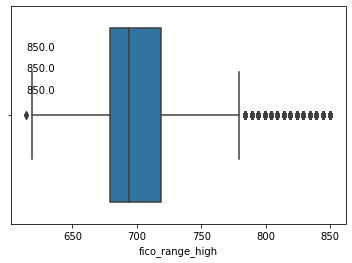

C:\Users\varun\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


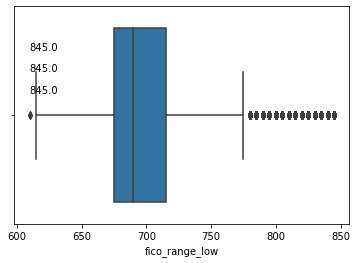

C:\Users\varun\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


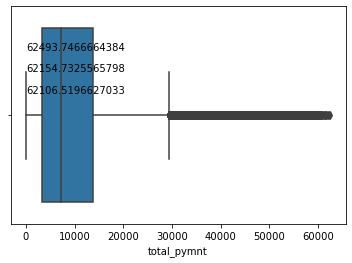

C:\Users\varun\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


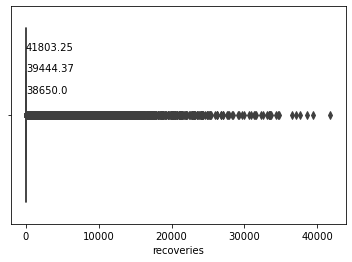

C:\Users\varun\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


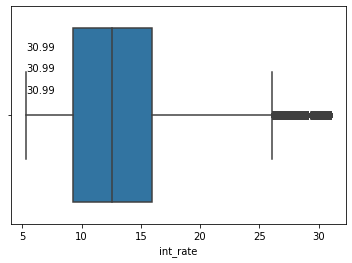

C:\Users\varun\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


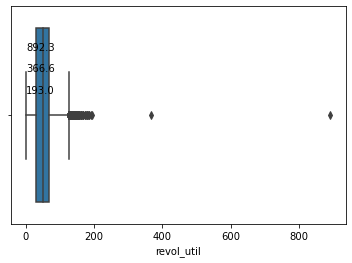

C:\Users\varun\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


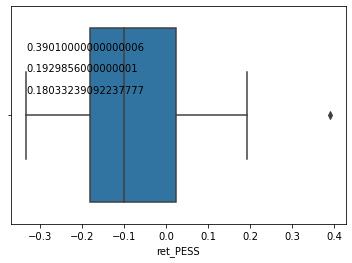

C:\Users\varun\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


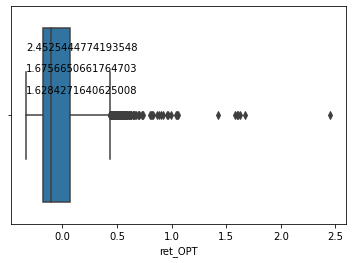

C:\Users\varun\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


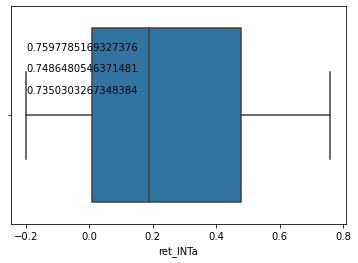

C:\Users\varun\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


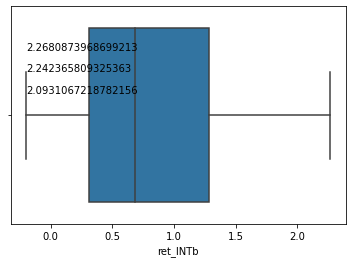

term
[' 36 months' ' 60 months']
 36 months    1949756
 60 months     815659
Name: term, dtype: int64


grade
['B' 'C' 'A' 'E' 'F' 'D' 'G']
B    811304
C    768632
A    596277
D    397211
E    138329
F     41596
G     12066
Name: grade, dtype: int64


emp_length
['10+ years' '< 1 year' '1 year' '3 years' '8 years' '9 years' '4 years'
 '5 years' '6 years' '2 years' '7 years' None]
10+ years    898370
< 1 year     253650
2 years      247379
3 years      219762
1 year       183001
5 years      171829
4 years      166566
6 years      123700
7 years      110120
8 years      107507
9 years       91449
Name: emp_length, dtype: int64


home_ownership
['RENT' 'OWN' 'MORTGAGE' 'OTHER' 'NONE' 'ANY']
MORTGAGE    1359007
RENT        1090600
OWN          312178
ANY            3393
OTHER           182
NONE             55
Name: home_ownership, dtype: int64


verification_status
['Verified' 'Source Verified' 'Not Verified']
Source Verified    1066701
Not Verified        997623
Verified            70109

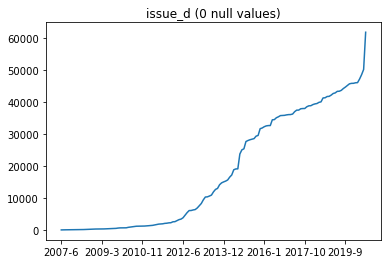

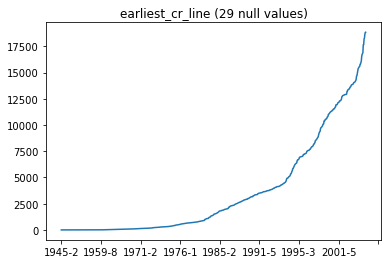

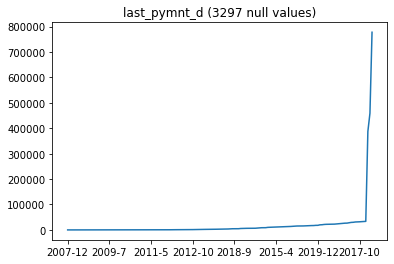

In [26]:
# visualize continuous features
visualize_float_columns()

# visulaize categorical features
visualize_cat_columns()

# visualize date columns
visualize_date_columns()

### Handle outliers

In [27]:
# Calculates to fraction of ouliers data across features
def outlier_calc(df):
    for i in float_cols + perc_cols:
        per_75=df[i].quantile(0.75)
        per_25=df[i].quantile(0.25)
        range_IQR=1.5*(per_75-per_25)
        
        #print(i," ; ",len(df[df[i]<=per_25-range_IQR]) + len(df[df[i]>=per_75+range_IQR]))
        print(i," - ",(len(df[df[i]<per_25-range_IQR]) + len(df[df[i]>per_75+range_IQR]))/len(df[i]))
        
outlier_calc(final_data)

loan_amnt  -  0.022600224559424172
funded_amnt  -  0.022600224559424172
annual_inc  -  0.04934304616124524
dti  -  0.012318223485444318
revol_bal  -  0.06142839320680621
delinq_2yrs  -  0.17928267547547114
open_acc  -  0.039152170650697996
pub_rec  -  0.14861566889598848
fico_range_high  -  0.03557585389534663
fico_range_low  -  0.03557585389534663
total_pymnt  -  0.04737878401614224
recoveries  -  0.05237405597351573
int_rate  -  0.014560201633389563
revol_util  -  4.773243798851167e-05


In [28]:
def remove_outliers(df,col_list):
    lower_thres=[]
    upper_thres=[]
    for i in col_list:
        per_75=df[i].quantile(0.75)
        per_25=df[i].quantile(0.25)
        lower_thres.append(per_25-1.5*(per_75-per_25))
        upper_thres.append(per_75+1.5*(per_75-per_25))
        
    #print("CALC DONE :)",df.shape,upper_thres,lower_thres)
    for i in range(len(col_list)):
        df = df[((df[col_list[i]]>=lower_thres[i]) & (df[col_list[i]]<=upper_thres[i]))]
     #   print('hi')
    return df

In [29]:
# There are quite a few outliers. 
# Please identify top-k (decide this based on the visualization) features where outliers are most obvious
n_rows = len(final_data)

col_list = ['revol_util','annual_inc']
final_data = remove_outliers(final_data,col_list) # remove outliers based 1st obvious feature



print("Removed " + str(n_rows - len(final_data)) + " rows")

Removed 138782 rows


In [30]:
# Remove all loans that are still current
n_rows = len(final_data)

final_data = final_data.loc[(final_data['loan_status'] == 'Fully Paid') | (final_data['loan_status'] == 'Charged Off') | (final_data['loan_status'] == 'Default')]

print("Removed " + str(n_rows - len(final_data)) + " rows")

Removed 1533542 rows


In [31]:
# Only include loans isssued since 2010
n_rows = len(final_data)

final_data = final_data.loc[(final_data['issue_d'] >= datetime.date(2010, 1, 1))]

print("Removed " + str(n_rows - len(final_data)) + " rows")

Removed 6310 rows


### Drop null values

In [32]:
# Deal with null values. We allow cateogrical variables to be null
# OTHER than grade, which is a particularly important categorical.
# All non-categorical variables must be non-null, and we drop
# rows that do not meet this requirement

required_cols = set(cols_to_pick) - set(cat_cols) - set(["id"])
required_cols.add("grade")

n_rows = len(final_data)

final_data.dropna(subset= required_cols,inplace = True) # drop rows that contain null based only on "required_cols"

print("Removed " + str(n_rows - len(final_data)) + " rows")

Removed 3382 rows


### Visualize clean data

C:\Users\varun\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


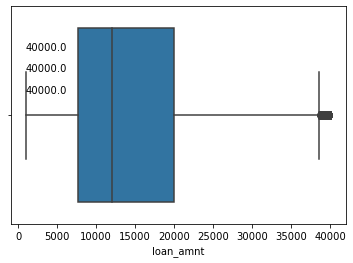

C:\Users\varun\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


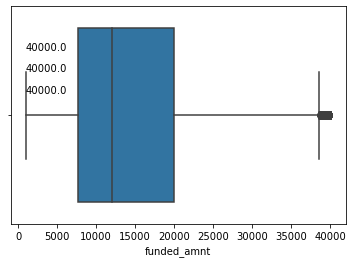

C:\Users\varun\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


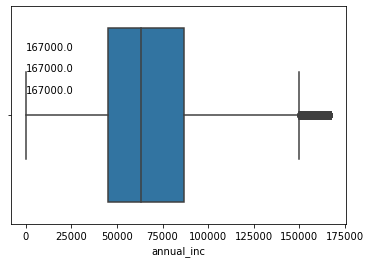

C:\Users\varun\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


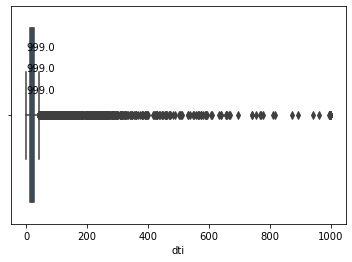

C:\Users\varun\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


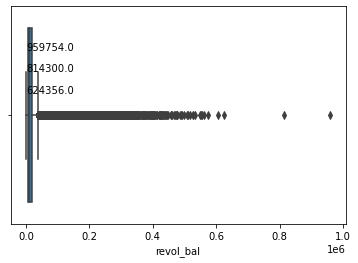

C:\Users\varun\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


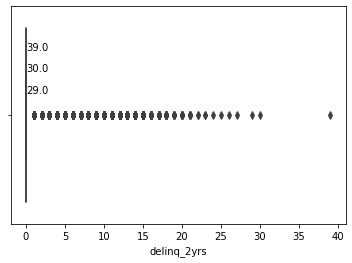

C:\Users\varun\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


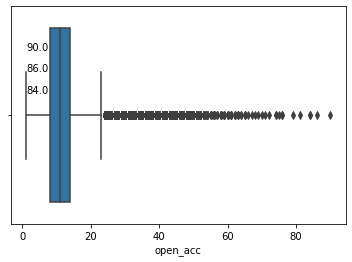

C:\Users\varun\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


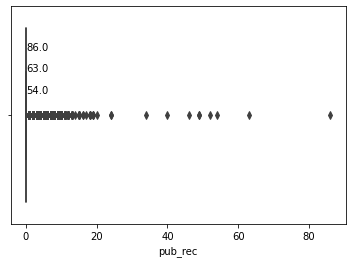

C:\Users\varun\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


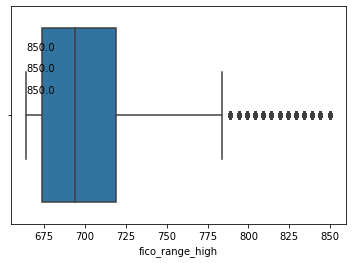

C:\Users\varun\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


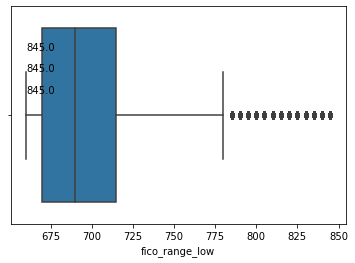

C:\Users\varun\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


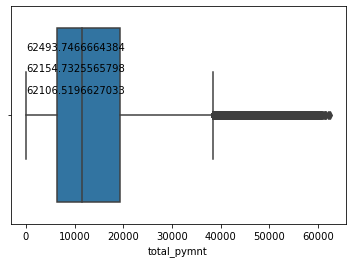

C:\Users\varun\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


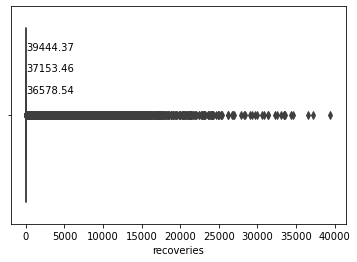

C:\Users\varun\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


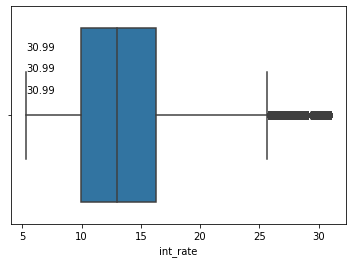

C:\Users\varun\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


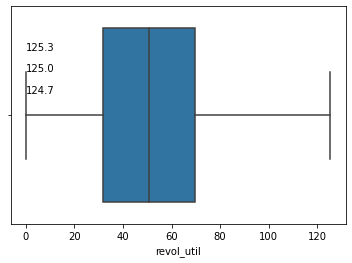

C:\Users\varun\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


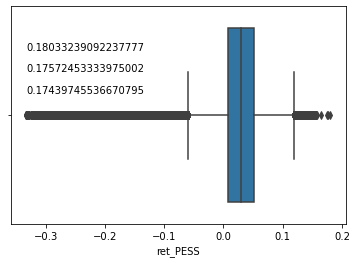

C:\Users\varun\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


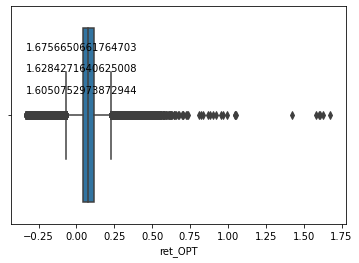

C:\Users\varun\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


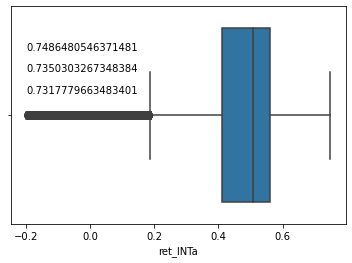

C:\Users\varun\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


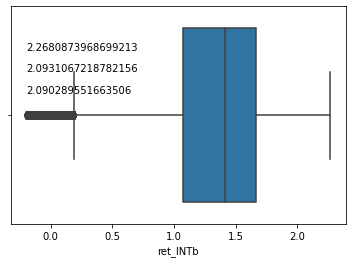

term
[' 36 months' ' 60 months']
 36 months    817896
 60 months    265503
Name: term, dtype: int64


grade
['B' 'C' 'A' 'E' 'F' 'D' 'G']
B    309923
C    300659
A    193159
D    170890
E     76321
F     25690
G      6757
Name: grade, dtype: int64


emp_length
['10+ years' '< 1 year' '1 year' '3 years' '8 years' '9 years' '4 years'
 '5 years' '6 years' '2 years' '7 years' None]
10+ years    351233
2 years       97714
< 1 year      87131
3 years       86790
1 year        71367
5 years       68600
4 years       65404
6 years       51989
7 years       48925
8 years       48265
9 years       39455
Name: emp_length, dtype: int64


home_ownership
['RENT' 'OWN' 'MORTGAGE' 'OTHER' 'NONE' 'ANY']
MORTGAGE    533190
RENT        434165
OWN         115353
ANY            599
OTHER           48
NONE            44
Name: home_ownership, dtype: int64


verification_status
['Verified' 'Source Verified' 'Not Verified']
Source Verified    399843
Not Verified       356537
Verified           327019
Name: ver

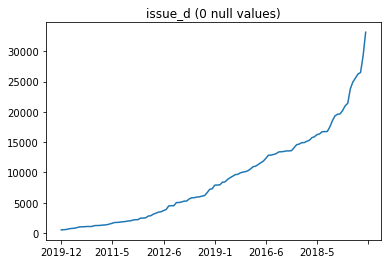

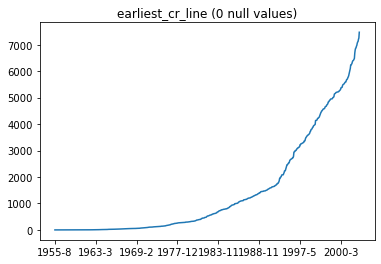

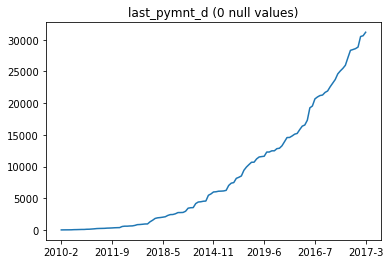

In [33]:
# Visualize the data again after cleaning

# visualize continuous features
visualize_float_columns()

# visulaize categorical features
visualize_cat_columns()

# visualize date columns
visualize_date_columns()

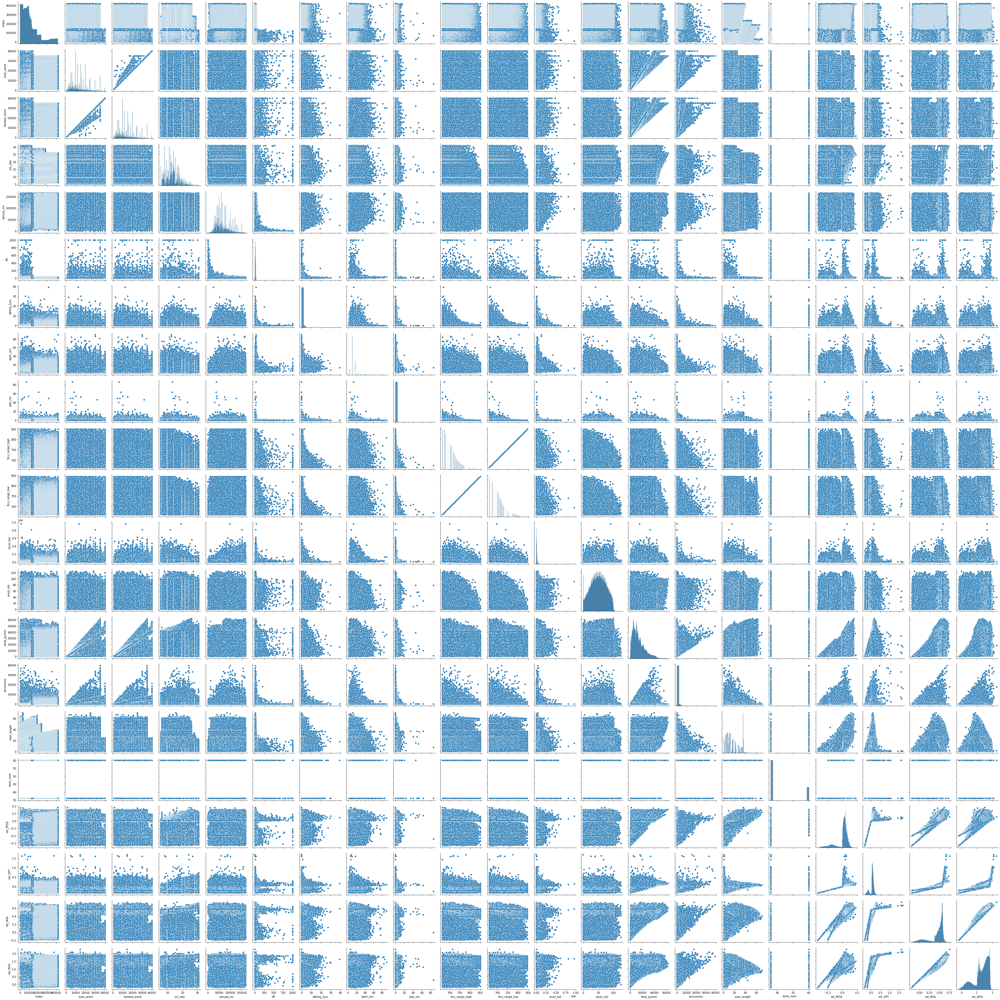

In [34]:
# Visualize the feature correlations
    # You can compute the correlation among features and display a heat-map of the matrix 
    # OR use sns scatter or pairplot
seaborn.pairplot(final_data)

<AxesSubplot:>

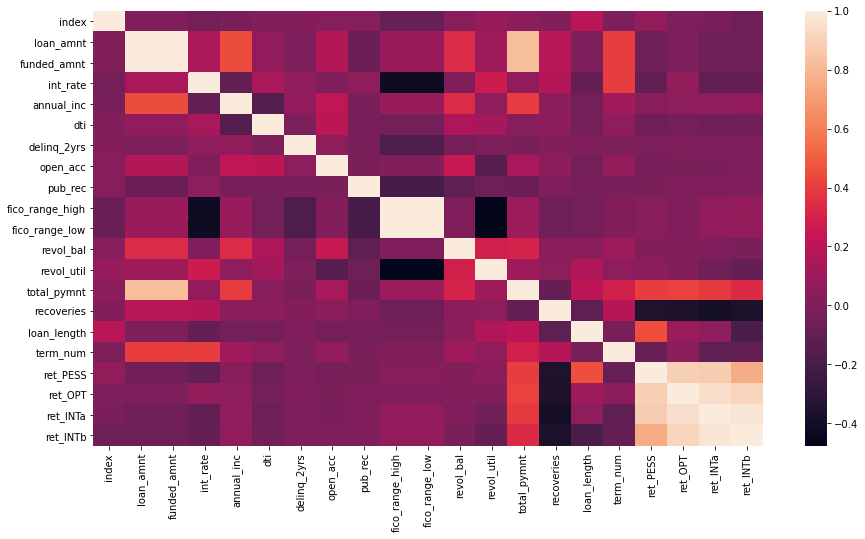

In [35]:
plt.figure(figsize=(15, 8))
seaborn.heatmap(final_data.corr())

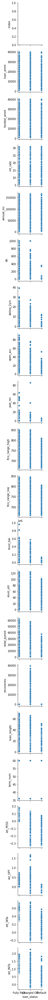

In [36]:
# Visualize relation between loan status and features
seaborn.pairplot(final_data,x_vars= 'loan_status')# sns pairplot or scatter plot. Refer to recitations


What do you observe after removing the outliers?

We observe that the data is much more balanced across the 3 loan statuses after we have removed outliers.

Specifically, for the fully paid loans, none of the return variables (pessimistic and optimistic) are negative. Only the charged off loans have values greater than zero for recoveries.

### Data Exploration
Solution to Q.7 from the handout

In [39]:
# Find the percentage of loans by grade, the default by grade,
# and the return of each grade
perc_by_grade = (final_data.grade.value_counts()*100/len(final_data)).sort_index()

default_by_grade = final_data.groupby("grade").apply(lambda x : (x.loan_status != "Fully Paid").sum()*100/len(x) )
ret_by_grade_OPT = final_data.groupby("grade")['ret_OPT'].mean()*100 # average return for M2-Optimistic for each loan grade
ret_by_grade_PESS = final_data.groupby("grade")['ret_PESS'].mean()*100 # average return for M1-Pessimistic for each loan grade
ret_by_grade_INTa = final_data.groupby("grade")['ret_INTa'].mean()*100 # average return for M3
ret_by_grade_INTb = final_data.groupby("grade")['ret_INTb'].mean()*100 # average return for M3
int_rate_by_grade = final_data.groupby("grade")['int_rate'].mean() # average interest rate for each grade

combined = pd.DataFrame(perc_by_grade)
combined.columns = ['perc_of_loans']
combined['perc_default'] = default_by_grade
combined['avg_int_rate'] = int_rate_by_grade
combined['return_OPT'] = ret_by_grade_OPT
combined['return_PESS'] = ret_by_grade_PESS
combined['return_INTa'] = ret_by_grade_INTa
combined['return_INTb'] = ret_by_grade_INTb

combined

,perc_of_loans,perc_default,avg_int_rate,return_OPT,return_PESS,return_INTa,return_INTb
A,17.828981,6.885001,7.226097,3.912401,1.135525,45.434521,133.744405
B,28.606543,14.262252,10.888362,4.954627,1.016617,44.720218,131.463285
C,27.751456,23.522994,14.211416,5.257323,-0.028888,43.041136,128.339944
D,15.773505,31.584645,18.003234,5.706750,-0.764312,41.261796,124.371836
E,7.044588,39.885484,21.243540,5.871278,-1.416199,39.055473,118.720448
F,2.371241,46.173608,24.759670,6.294687,-1.721695,37.524252,114.870978
G,0.623685,49.844606,27.302041,6.409403,-2.894651,35.809215,112.671968


Based on the output of previous cell, write down your answers to Q.7 from the handout.

### Save a Pickle

In [40]:
len(set(continuous_features))

14

In [41]:
len(set(continuous_features) - set(["total_pymnt","recoveries"]))

12

In [42]:
# Remove the "total_pymnt" and "recoveries" from the list of continuous features
continuous_features = set(continuous_features) - set(["total_pymnt","recoveries"])

Why did we remove `total_pymt` and `recoveries` from the data for the task of predicting whether to give loan or not, although these are highly predictive features?

Total_pymnt refers to the total payment received to date. 'Recoveries' refers to the post-charge-off gross recovery. We should not use either of these 2 variables while
training a model because 'total_pymnt' and 'recoveries' will not be available to the model at the time of testing.
Including this feature during training will lead to data leakage.

In [43]:
# save the prepared data for modeling in next Phase.
pickle.dump( [final_data, discrete_features, continuous_features, ret_cols], open(pickle_file, "wb") )

In [44]:
final_data.shape

(1083399, 32)